# simple k-space trajectory optimization based on SNOPY
**paper:**\
Wang G, Nielsen JF, Fessler JA, Noll DC.\
Stochastic optimization of three-dimensional non-Cartesian sampling trajectory\
Magnetic Resonance in Medicine. 2023;90(2):417-431. https://dx.doi.org/10.1002/mrm.29645

**original code:** https://github.com/guanhuaw/SNOPY

**related work:**
https://archive.ismrm.org/2021/4200.html


## setup

In [1]:
# general setup
import os
import sys
if not os.path.isdir('SNOPY'):
    !git clone https://github.com/guanhuaw/SNOPY.git
sys.path.append('./SNOPY')

datapath = './data/testdata.mat'

# colab-specific setup
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

if IN_COLAB:
    !pip install torchkbnufft
    !pip install mirtorch
    !pip install git+https://github.com/cetmann/iunets/
    if not os.path.isdir('./traj_learning_demo/'):
        !git clone https://github.com/fglang/traj_learning_demo.git
    sys.path.append('./traj_learning_demo/')
    datapath = './traj_learning_demo/data/testdata.mat'

In [2]:
import time
from SimpleQPWLS_model import SimpleQPWLSModel
from models.mirtorch_pkg import NuSense_om
from types import SimpleNamespace
import torch
import numpy as np
import os
import matplotlib.pyplot as plt
from tools import *
from IPython.display import clear_output

f:\LOCAL_GIT\external\trajlearning\standalone_test\.venv\lib\site-packages\memcnn\models\revop.py:24: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @custom_fwd(cast_inputs=torch.float32)
f:\LOCAL_GIT\external\trajlearning\standalone_test\.venv\lib\site-packages\memcnn\models\revop.py:74: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  def backward(ctx, *grad_outputs):  # pragma: no cover


## initialize trajectory

### radial out

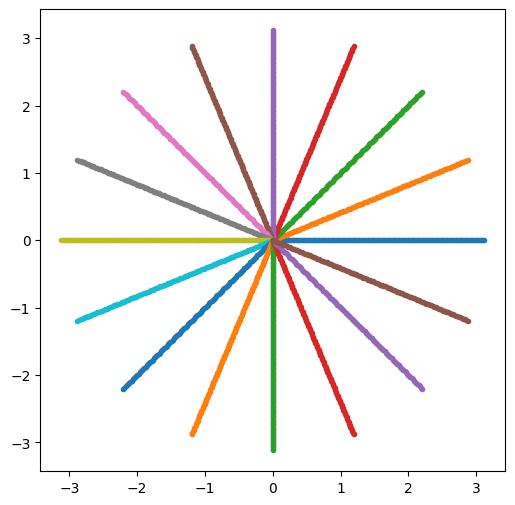

In [3]:
# trajectory initialization: radial out
nx = 64 # image
nread = nx * 2
nshot = nx // 4 # accel

phi = np.arange(0, 2*np.pi, 2*np.pi/nshot)
kx0 = np.arange(0, +np.pi, np.pi/nread) # asymmetric, hit center
# kx0 = np.linspace(-np.pi, +np.pi, nread) # symmetric, miss center

kx = kx0.reshape(1,nread) * np.cos(phi).reshape(nshot,1)
ky = kx0.reshape(1,nread) * np.sin(phi).reshape(nshot,1)
kz = np.zeros(kx.shape)

k = np.stack([kx.flatten(), ky.flatten(), kz.flatten()], 0) # assumed convention: shots x read

plt.figure(figsize=(6,6))
for jj in range(nshot):
    plt.plot(kx[jj,:],ky[jj,:],'.-')

fname_traj = './radial.npy'
np.save(fname_traj, arr=k)

## settings

In [4]:
opt = SimpleNamespace()

# basics params
opt.which_model_netD_I = 'samplingBspline'
opt.model = 'SimpleQPWLS' # demo model, 2D SENSE reco
opt.gpu_ids = [0]
opt.name = 'simpleSNOPY'

# training params
opt.niter = 50 # numbe rof iterations
opt.niter_decay = 50 # control learning rate decay
opt.lr_traj = 5e-2 # learning rate for k-space trajectory
opt.lr_policy = 'lambda' # strategy for learning rate schedule
opt.sgld = False # False -> Adam

# regularization parameters for balancing loss terms
opt.loss_content_I_l1 = 0 # L1 loss (truth - reco)
opt.loss_content_I_l2 = 400 # L2 loss (truth - reco)
opt.loss_slew = 1 # slew rate penalty
opt.loss_grad = 1 # grad ampl penalty
opt.loss_TE_index = 0 # enforce trajectory at this index (along read) to 0 [~"here is TE"]
opt.loss_TE = 1 # strength of TE penalty
opt.loss_pi = 1 # keep trajectory support to disk with radius pi

# reco parameters
opt.noise_level = 0.005 # inject Gaussian noise during training
opt.num_blocks = 10 # number of CG SENSE reco iterations ("inner loop")
opt.CGtol = 0.0005 # CG SENSE param
opt.CGlambda = 0.001 # CG SENSE param
opt.use_rough = False # roughness penalty, L2 of finite differences, Tikhonov type
opt.grid_size = 2 # NUFFT grid oversampling
opt.numpoints = 6 # NUFFT

# trajectory parameters
opt.gradmax = 5 # Gauss/cm [=10mT/m]
opt.slewmax = 18000 # Gauss/cm/s [=0.01T/m/s]
opt.iso_constraint = False # gradient constraint for all possible orientations?
opt.decim_rate = 4 # how many trajectory samples controlled by one spline coefficient, 1: no splines
opt.padding = 400 # for b-spline representation at the edges of each shot interval
opt.dt = 1e-5 # BWperPixel = 1/(opt.dt*nread)
opt.resx = 0.2 # cm
opt.resy = 0.2 # cm
opt.resz = 1 # cm

# book keeping, set previously
opt.mask_path = fname_traj
opt.nx = nx
opt.ny = nx
opt.nz = 1
opt.num_shots = nshot
opt.nfe = nread

set_misc_params(opt)

## run iterations

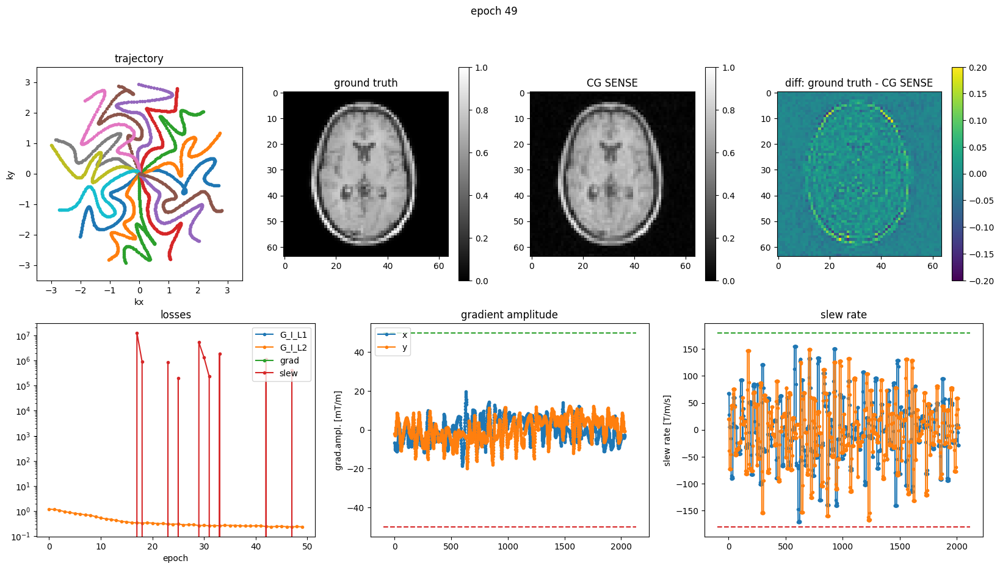

In [5]:
# setup model
model = SimpleQPWLSModel()
model.initialize(opt)
model.setup(opt)

for epoch in range(0, opt.niter):
    # learn on single dataset for demo, (more advanced: replace by dataloader)
    model.set_input(datapath)

    # learning step
    model.optimize_parameters()
    torch.cuda.reset_peak_memory_stats()

    # visualize current state
    clear_output(wait=True)
    plot_epoch(model, opt, epoch)



## simple eddy current simulation
assuming the following model:
$$ \mathbf{G}(t)=\mathbf{g}(t)-\dot{\mathbf{g}}(t)\otimes \Theta (t){\sum}_n{\alpha}_n\exp \left(-\frac{t}{\tau_n}\right) $$
with actually realized gradient waveforms $\mathbf{G}(t)$, nominal waveforms $\mathbf{g}(t)$, slew rate $\dot{\mathbf{g}}(t)$, Heaviside step function $\Theta (t)$.

see e.g. Jehenson et al., https://dx.doi.org/10.1016/0022-2364(90)90133-T \

Simulate the effect by using the perturbed trajectory for the forward operator, but the nominal (unperturbed) trajectory for the reconstruction operator.

recent approach of compensation based on differentiable optimization: \
West et al., https://dx.doi.org/10.1002/mrm.70093

C:\Users\fmglang\AppData\Local\Temp\ipykernel_47192\2171001858.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(25,6))


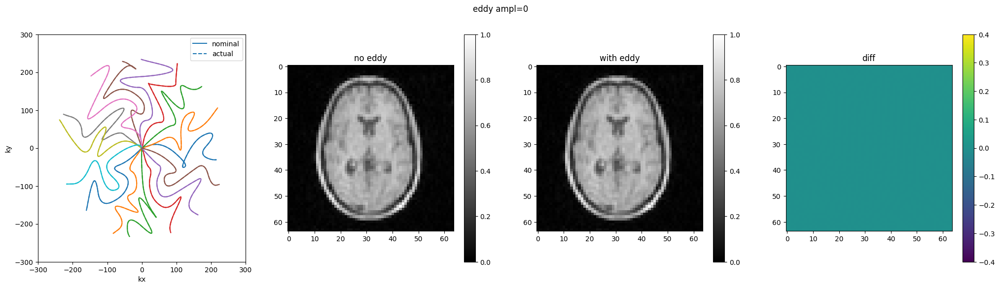

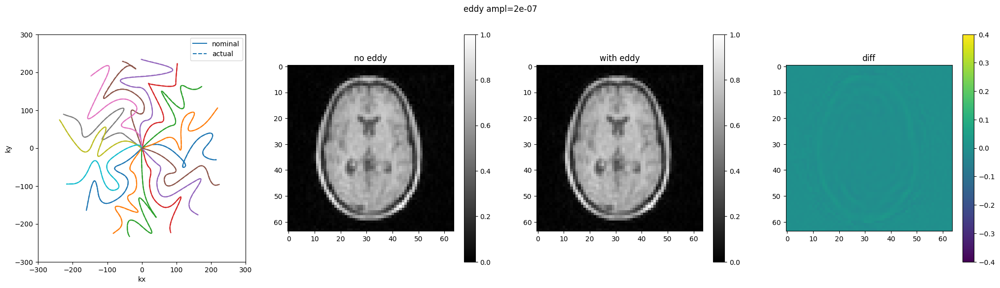

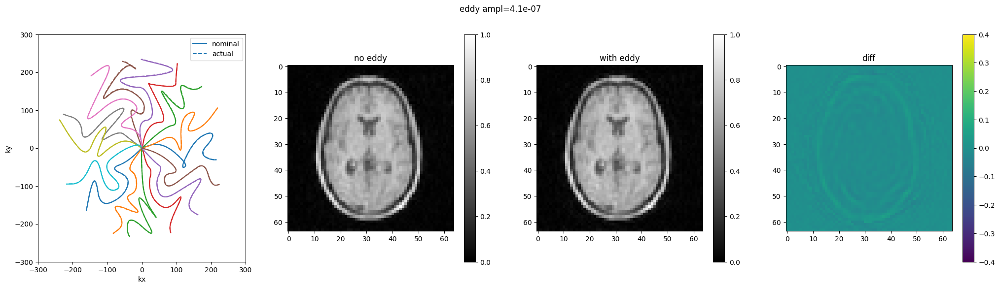

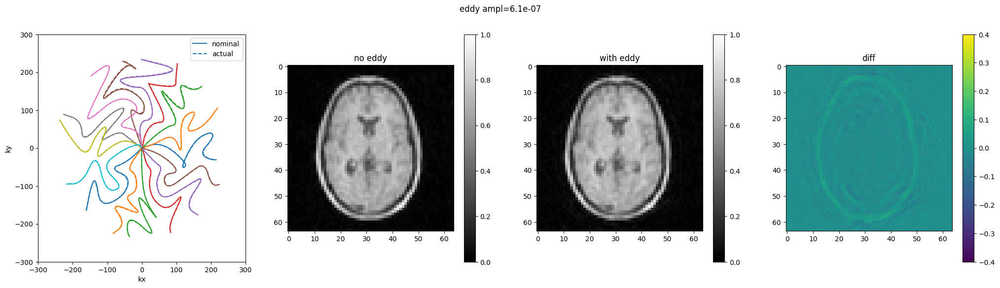

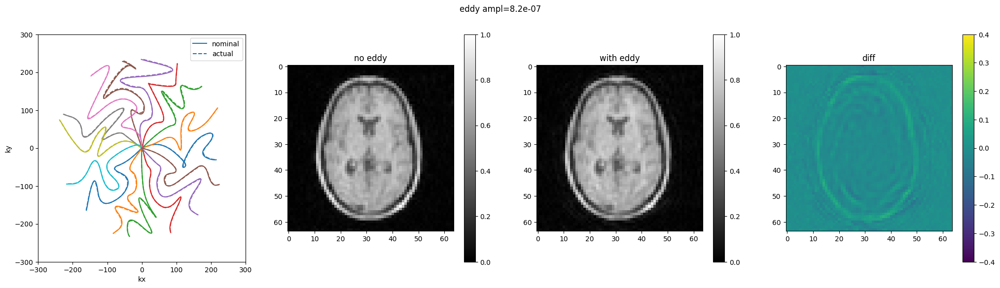

...

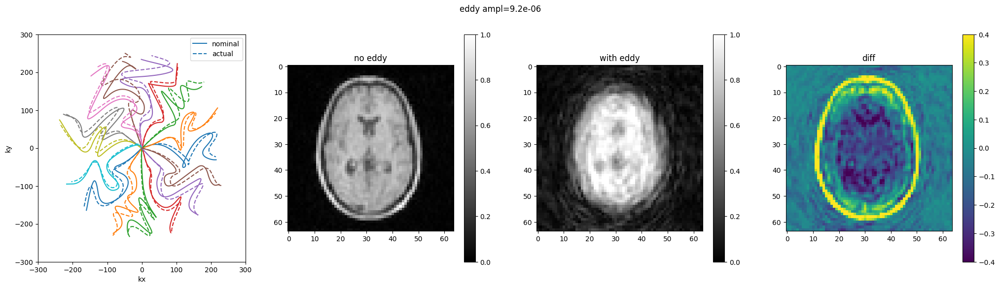

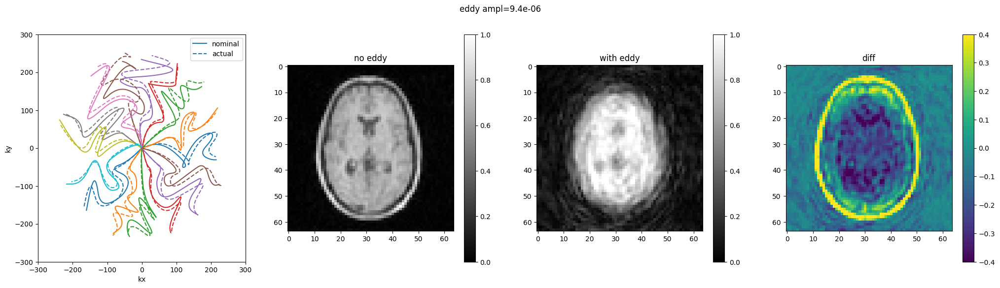

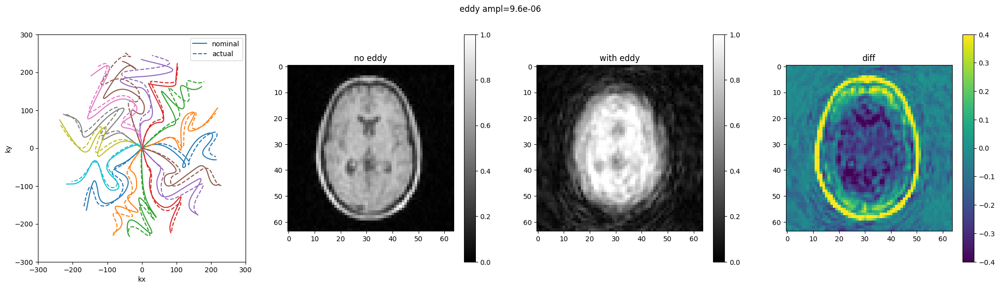

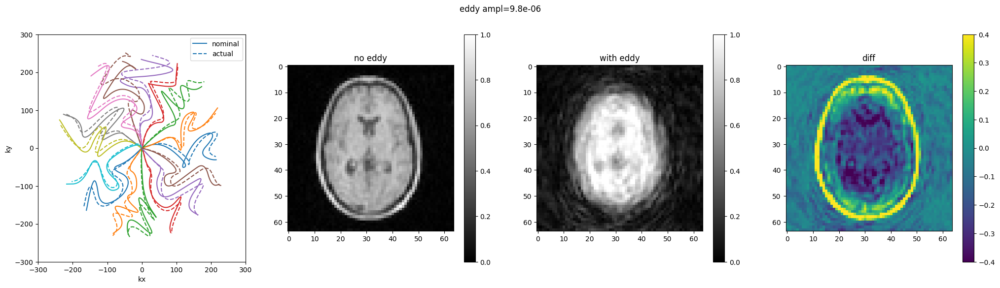

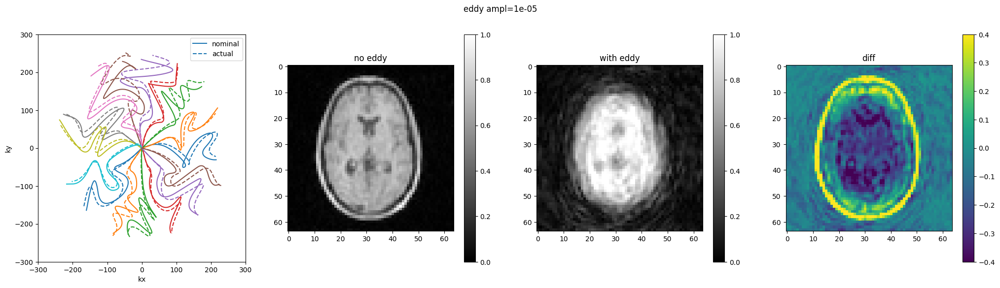

In [ ]:
ampl = 1e-6 # scaling the strength of eddy current effect
alphas = [1,     0] # relative amplitudes of EC components
taus =   [50e-6, 1e-1] # time constants

k_nominal = traj2phys(model.ktraj.reshape(2,opt.num_shots,opt.nfe), res=opt.resx*1e-2).detach()
k_perturbed = eddy_perturbation(k_nominal, opt, ampl=ampl, alphas=alphas, taus=taus)

# simulate with nominal and perturbed trajectories

model.set_input(datapath)

def simu_traj_reco(model, k_meas, opt):
    # SENSE operator with actual trajectory for "measurement"
    A_meas = NuSense_om(model.smap, k_meas, numpoints=opt.numpoints, grid_size=opt.grid_size, norm='ortho')
    # forward operator with nominal traj for reco
    A_reco = model.A      
    # "measured" data
    kunder = A_meas * (model.Ireal)
    # reconstruct with nominal traj
    reco = (model.P * (A_reco.H * kunder)).squeeze() # model.P is the "inverse gram operator", approximating inv(A.H @ A) by CG iterations
    
    return reco

ktraj_meas = traj2norm(k_perturbed, res=opt.resx*1e-2).reshape(1,2,-1) # to normalized units

reco = simu_traj_reco(model, model.ktraj, opt) # forward and reco with nominal
reco_perturbed = simu_traj_reco(model, ktraj_meas, opt) # forward with perturbed, reco with nominal -> MISMATCH!

# visualize
diffp = reco.abs() - reco_perturbed.abs()
plt.figure(figsize=(25,6))
plt.subplot(1,4,1)
for jj in range(opt.num_shots):
    h = plt.plot(k_nominal[0,jj,:].cpu(), k_nominal[1,jj,:].cpu(), '-')
    plt.plot(k_perturbed[0,jj,:].cpu(), k_perturbed[1,jj,:].cpu(), '--', color=h[0].get_color())
plt.xlabel('kx'), plt.ylabel('ky'), plt.legend(['nominal', 'actual'])
plt.xlim([-300,+300]), plt.ylim([-300,+300])
plt.subplot(1,4,2)
plt.imshow(reco.abs().cpu().detach(), vmin=0, vmax=1, cmap='gray'), plt.colorbar()
plt.title('no eddy')
plt.subplot(1,4,3)
plt.imshow(reco_perturbed.abs().cpu().detach(), vmin=0, vmax=1, cmap='gray'), plt.colorbar()
plt.title(f'with eddy')
plt.subplot(1,4,4)
plt.imshow(diffp.cpu().detach(), vmin=-0.4, vmax=+0.4), plt.colorbar()
plt.title('diff')
plt.suptitle(f'eddy ampl={ampl:.2g}')
